In [1]:
import numpy as np
import matplotlib.pyplot as plt
import re  # For regular expression matching
#import plotly.graph_objects as go
from scipy.signal import find_peaks
import itertools
from itertools import combinations

In [2]:
# Given Ca40 state energies
ca40_state_energies = [
    0, 3.73669, 3.90438, 4.49143, 5.21156, 5.24879, 5.27880, 5.61352, 5.62941,
    5.90263, 6.02547, 6.02971, 6.16000, 6.28515, 6.42240, 6.50787, 6.54280, 
    6.58247, 6.75041, 6.90870, 6.93020, 6.93129, 6.93800, 6.95048, 7.10000, 
    7.11310, 7.11373, 7.23907, 7.27782, 7.30067, 7.39720, 7.42190, 7.44623, 
    7.46635, 7.48100, 7.53226, 7.56117, 7.62311, 7.65823, 7.67660, 7.69408, 
    7.70180, 7.76940, 7.81470, 7.87000, 7.87218, 7.92842, 7.97250, 7.97440, 
    7.97655, 8.01880, 8.05180, 8.09161, 8.10010, 8.11320, 8.13477, 8.18750, 
    8.19590, 8.27100, 8.27600, 8.32316, 8.33800, 8.35890, 8.36400, 8.37394, 
    8.42481, 8.43900, 8.48402, 8.54000, 8.55110, 8.57880, 8.58700, 8.63300, 
    8.66530, 8.67829, 8.70100, 8.71700, 8.74822, 8.76418, 8.810, 8.8506, 8.909, 8.9348, 8.9358]
#8.9384,8.9786, 8.9825

In [3]:
beam_energy = np.array([650.17, 644.49, 638.45, 633.58, 629.03, 623.77, 616.86, 611.80, 
                 606.29, 601.98, 598.82, 596.70, 593.47, 559.57, 554.77, 550.57, 
                 546.80, 542.61, 538.64, 537.43, 536.41])


In [4]:
ca40_state_energies[83]

8.9358

In [5]:
# Looking at all the primary-gamma-ray transitions
E_gamma_primary = 8935.8 - np.array(ca40_state_energies)*1000


In [6]:
E_gamma_primary

array([ 8.9358000e+03,  5.1991100e+03,  5.0314200e+03,  4.4443700e+03,
        3.7242400e+03,  3.6870100e+03,  3.6570000e+03,  3.3222800e+03,
        3.3063900e+03,  3.0331700e+03,  2.9103300e+03,  2.9060900e+03,
        2.7758000e+03,  2.6506500e+03,  2.5134000e+03,  2.4279300e+03,
        2.3930000e+03,  2.3533300e+03,  2.1853900e+03,  2.0271000e+03,
        2.0056000e+03,  2.0045100e+03,  1.9978000e+03,  1.9853200e+03,
        1.8358000e+03,  1.8227000e+03,  1.8220700e+03,  1.6967300e+03,
        1.6579800e+03,  1.6351300e+03,  1.5386000e+03,  1.5139000e+03,
        1.4895700e+03,  1.4694500e+03,  1.4548000e+03,  1.4035400e+03,
        1.3746300e+03,  1.3126900e+03,  1.2775700e+03,  1.2592000e+03,
        1.2417200e+03,  1.2340000e+03,  1.1664000e+03,  1.1211000e+03,
        1.0658000e+03,  1.0636200e+03,  1.0073800e+03,  9.6330000e+02,
        9.6140000e+02,  9.5925000e+02,  9.1700000e+02,  8.8400000e+02,
        8.4419000e+02,  8.3570000e+02,  8.2260000e+02,  8.0103000e+02,
      

In [7]:
import itertools

# Find all possible transitions (E_initial -> E_final, where E_initial > E_final)
transitions = []

for initial, final in itertools.combinations(ca40_state_energies[:-1], 2):
    #print(initial,final)
    if final > initial:
        gamma_energy = final - initial
        transitions.append((final, initial, gamma_energy))

for final, initial, gamma_energy in transitions:
        print(f"Transition: {final:.5f} MeV -> {initial:.5f} MeV, Gamma Energy = {gamma_energy:.5f} MeV")


Transition: 3.73669 MeV -> 0.00000 MeV, Gamma Energy = 3.73669 MeV
Transition: 3.90438 MeV -> 0.00000 MeV, Gamma Energy = 3.90438 MeV
Transition: 4.49143 MeV -> 0.00000 MeV, Gamma Energy = 4.49143 MeV
Transition: 5.21156 MeV -> 0.00000 MeV, Gamma Energy = 5.21156 MeV
Transition: 5.24879 MeV -> 0.00000 MeV, Gamma Energy = 5.24879 MeV
Transition: 5.27880 MeV -> 0.00000 MeV, Gamma Energy = 5.27880 MeV
Transition: 5.61352 MeV -> 0.00000 MeV, Gamma Energy = 5.61352 MeV
Transition: 5.62941 MeV -> 0.00000 MeV, Gamma Energy = 5.62941 MeV
Transition: 5.90263 MeV -> 0.00000 MeV, Gamma Energy = 5.90263 MeV
Transition: 6.02547 MeV -> 0.00000 MeV, Gamma Energy = 6.02547 MeV
Transition: 6.02971 MeV -> 0.00000 MeV, Gamma Energy = 6.02971 MeV
Transition: 6.16000 MeV -> 0.00000 MeV, Gamma Energy = 6.16000 MeV
Transition: 6.28515 MeV -> 0.00000 MeV, Gamma Energy = 6.28515 MeV
Transition: 6.42240 MeV -> 0.00000 MeV, Gamma Energy = 6.42240 MeV
Transition: 6.50787 MeV -> 0.00000 MeV, Gamma Energy = 6.50787

In [8]:
secondary_transitions_array = np.array(transitions)

In [9]:
secondary_gamma_energy_array = secondary_transitions_array[:,2]

In [10]:
secondary_gamma_energy_array =secondary_gamma_energy_array*1000

In [11]:
len(secondary_gamma_energy_array)

3403

In [12]:
# Set default figure size and DPI for all plots
plt.rcParams['figure.figsize'] = (12, 8)   # Set size: 12 inches by 8 inches
plt.rcParams['figure.dpi'] = 300           # Set the DPI to 300

# You can also set other parameters if necessary
# For example:
plt.rcParams['axes.labelsize'] = 14         # Font size for axis labels
plt.rcParams['xtick.labelsize'] = 12        # Font size for x-axis ticks
plt.rcParams['ytick.labelsize'] = 12        # Font size for y-axis ticks
plt.rcParams['axes.titlesize'] = 16         # Font size for plot titles

In [13]:
"""

run_number = input("Please enter the Run number (e.g., 001): ")
datafile_1 = np.loadtxt("/data/pagroup/pa02/ND_39K_pg_data/Spectra/2021-07-39K-Run%s.mpa" %(run_number),skiprows=8566,max_rows=8192)
datafile_2 = np.loadtxt("/data/pagroup/pa02/ND_39K_pg_data/Spectra/2021-07-39K-Run%s.mpa"%(run_number),skiprows=16759,max_rows=8192)
caloff_1=11.306600
calfact_1=1.619880
caloff_2=11.306600
calfact_2=1.619880
y_data_1 = datafile_1
y_data_err_1 = np.sqrt(y_data_1)
y_data_2 = datafile_2
y_data_err_2 = np.sqrt(y_data_2)
x_1 = list(range(8192))
x_cal_1 = (np.array(x_1))*calfact_1 +  caloff_1
binwidth_1 = (8192*calfact_1 + caloff_1)/(8192)
x_2 = list(range(8192))
x_cal_2 = (np.array(x_2))*calfact_2 +  caloff_2
binwidth_2 = (8192*calfact_2 + caloff_2)/(8192)
#Matplotlib figure details 

fig,ax=plt.subplots(1,1,figsize=(20,20))
fig.set_dpi(300)
fig.set_size_inches(12,8)


plt.step(x_cal_1,y_data_1,label="ADC_1")
#plt.step(x_cal_2,y_data_2,label="ADC_2")
#plt.yscale("log")
plt.legend()
"""

'\n\nrun_number = input("Please enter the Run number (e.g., 001): ")\ndatafile_1 = np.loadtxt("/data/pagroup/pa02/ND_39K_pg_data/Spectra/2021-07-39K-Run%s.mpa" %(run_number),skiprows=8566,max_rows=8192)\ndatafile_2 = np.loadtxt("/data/pagroup/pa02/ND_39K_pg_data/Spectra/2021-07-39K-Run%s.mpa"%(run_number),skiprows=16759,max_rows=8192)\ncaloff_1=11.306600\ncalfact_1=1.619880\ncaloff_2=11.306600\ncalfact_2=1.619880\ny_data_1 = datafile_1\ny_data_err_1 = np.sqrt(y_data_1)\ny_data_2 = datafile_2\ny_data_err_2 = np.sqrt(y_data_2)\nx_1 = list(range(8192))\nx_cal_1 = (np.array(x_1))*calfact_1 +  caloff_1\nbinwidth_1 = (8192*calfact_1 + caloff_1)/(8192)\nx_2 = list(range(8192))\nx_cal_2 = (np.array(x_2))*calfact_2 +  caloff_2\nbinwidth_2 = (8192*calfact_2 + caloff_2)/(8192)\n#Matplotlib figure details \n\nfig,ax=plt.subplots(1,1,figsize=(20,20))\nfig.set_dpi(300)\nfig.set_size_inches(12,8)\n\n\nplt.step(x_cal_1,y_data_1,label="ADC_1")\n#plt.step(x_cal_2,y_data_2,label="ADC_2")\n#plt.yscale("lo

In [14]:
def extract_calibration_info(file_path):
    cal_info = {}

    with open(file_path, 'r') as file:
        current_adc = None
        for line in file:
            line = line.strip()

            # Detect ADC sections
            if line.startswith("[ADC"):
                current_adc = line.strip("[]")
                cal_info[current_adc] = {}

            # Detect DATA sections
            if line.startswith("[DATA"):
                current_adc = line.strip("[]")
                cal_info[current_adc] = []

            # Extract caloff and calfact
            if "caloff" in line and current_adc:
                cal_info[current_adc]['caloff'] = float(line.split('=')[1])
            if "calfact" in line and current_adc:
                cal_info[current_adc]['calfact'] = float(line.split('=')[1])

            # Extract DATA values
            if current_adc and line.isdigit() and current_adc.startswith("DATA"):
                cal_info[current_adc].append(int(line))

    return cal_info



# Print the extracted calibration data
#for adc, data in calibration_data.items():
    #print(f"{adc}: {data}")

In [15]:
runNumber = range(147,167)

In [16]:
len(runNumber)

20

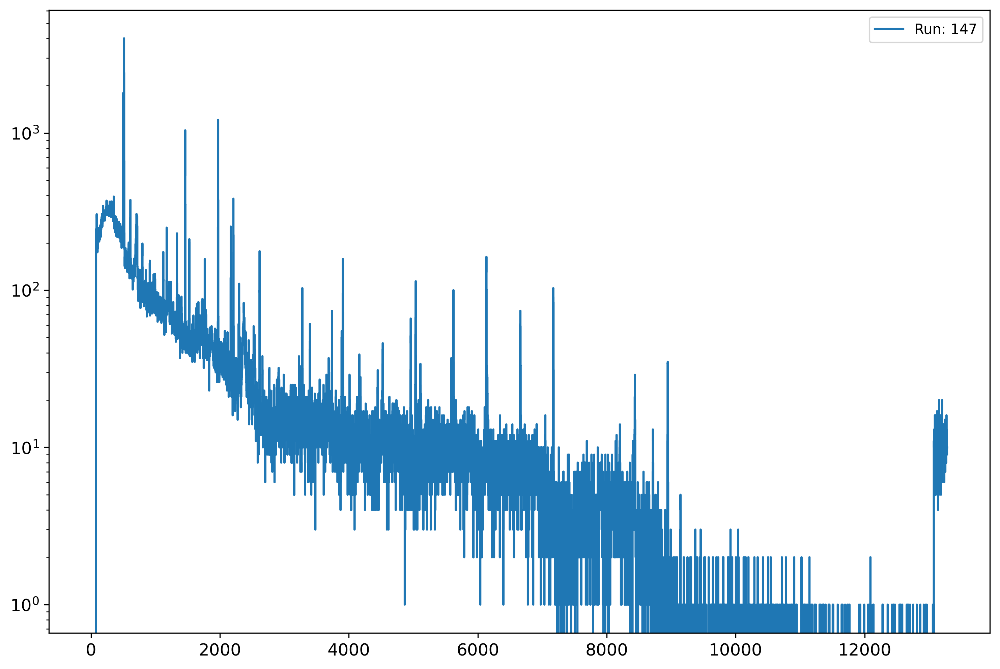

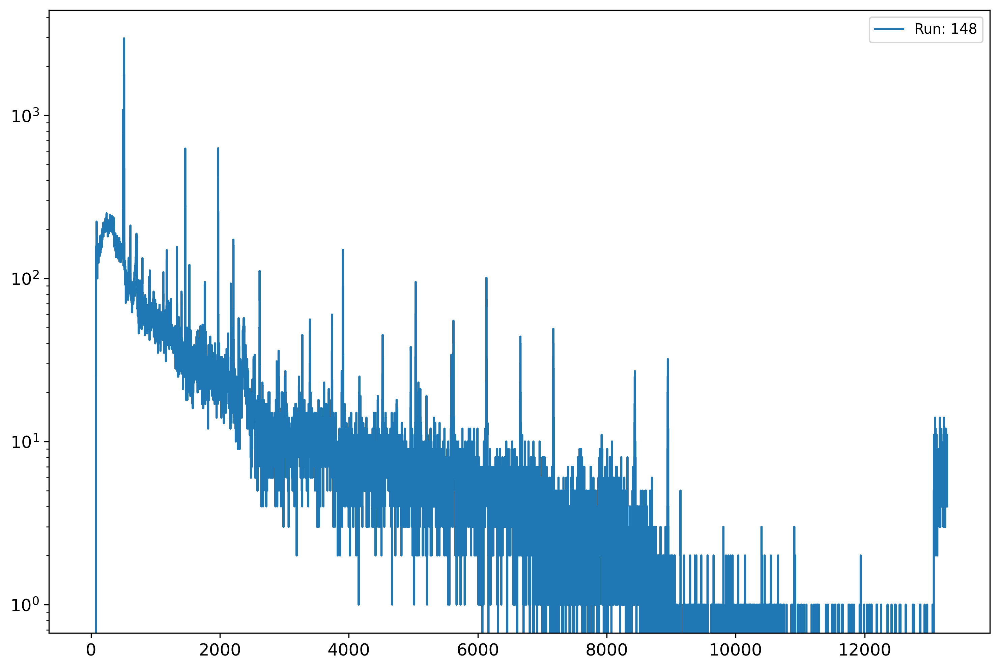

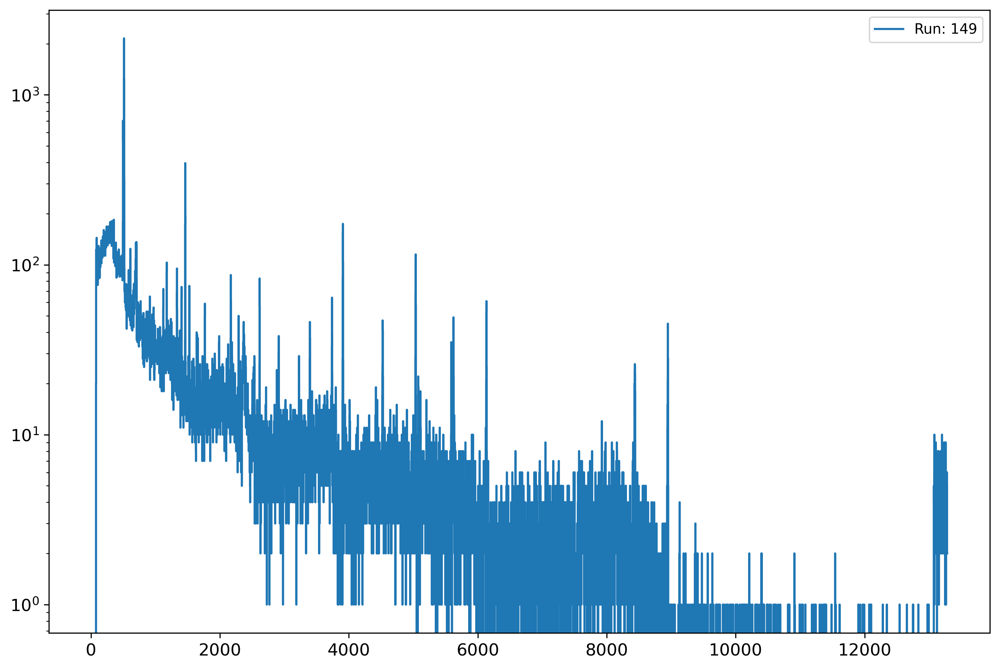

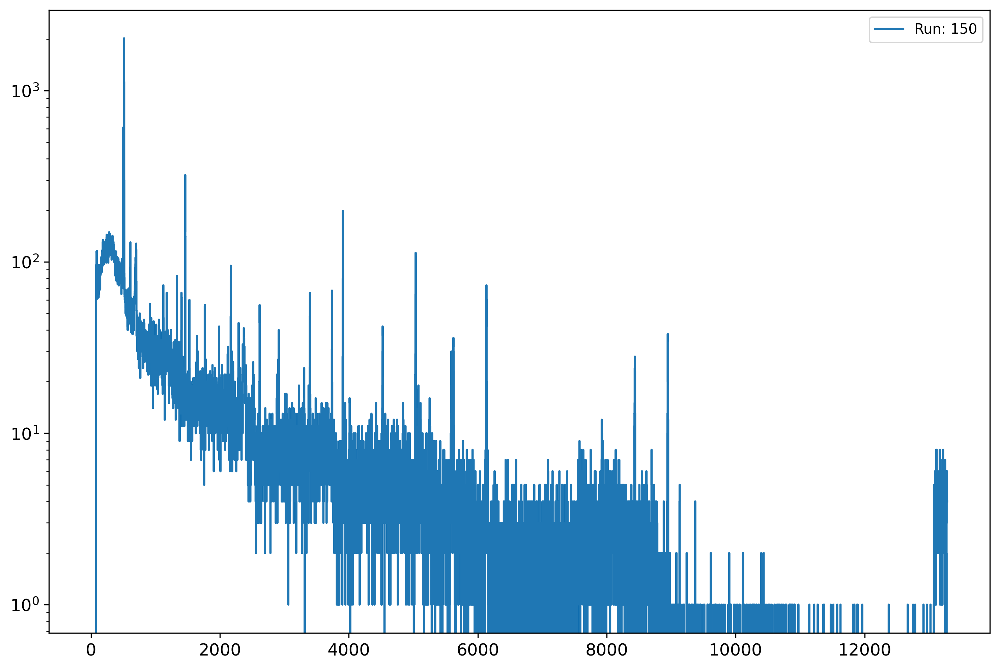

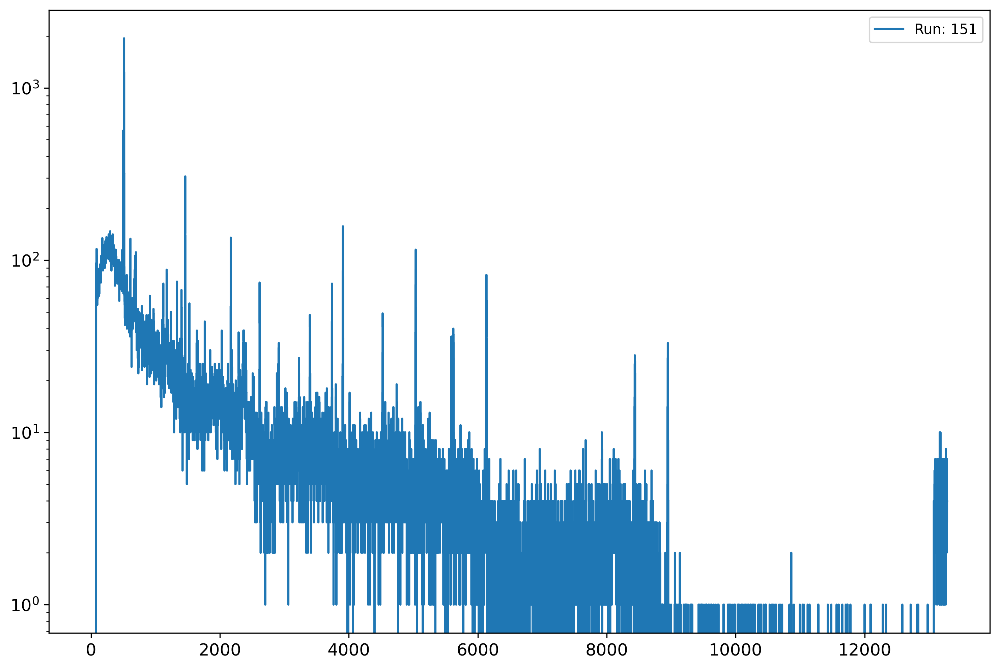

...

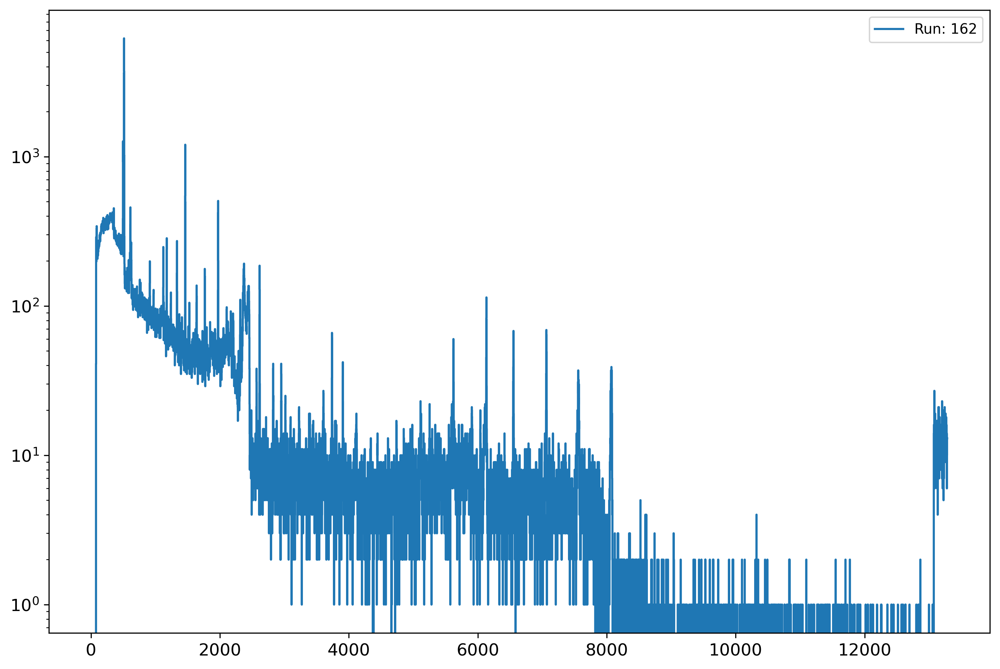

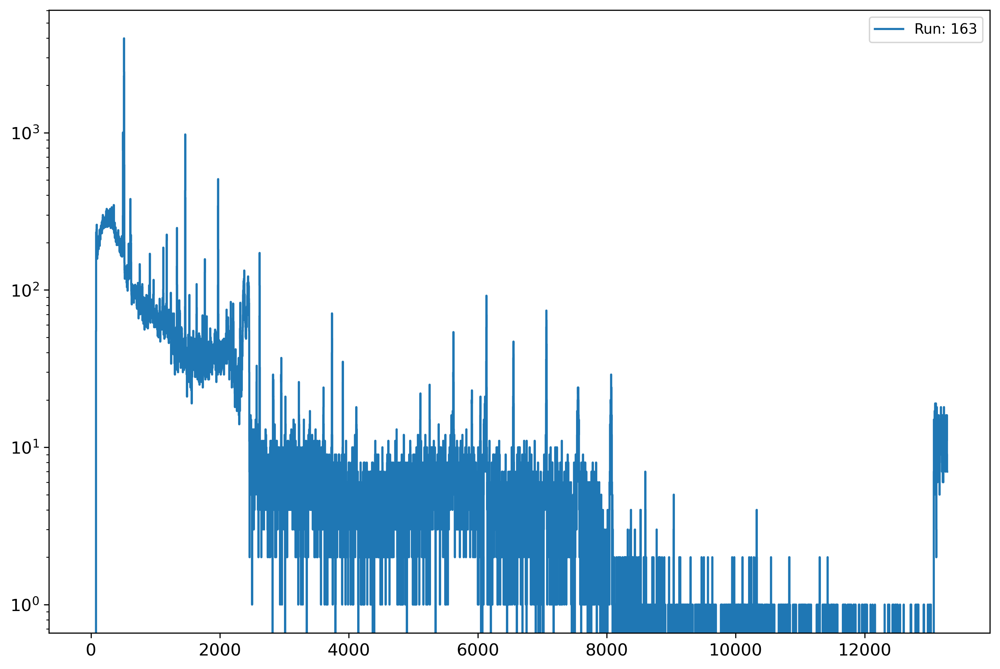

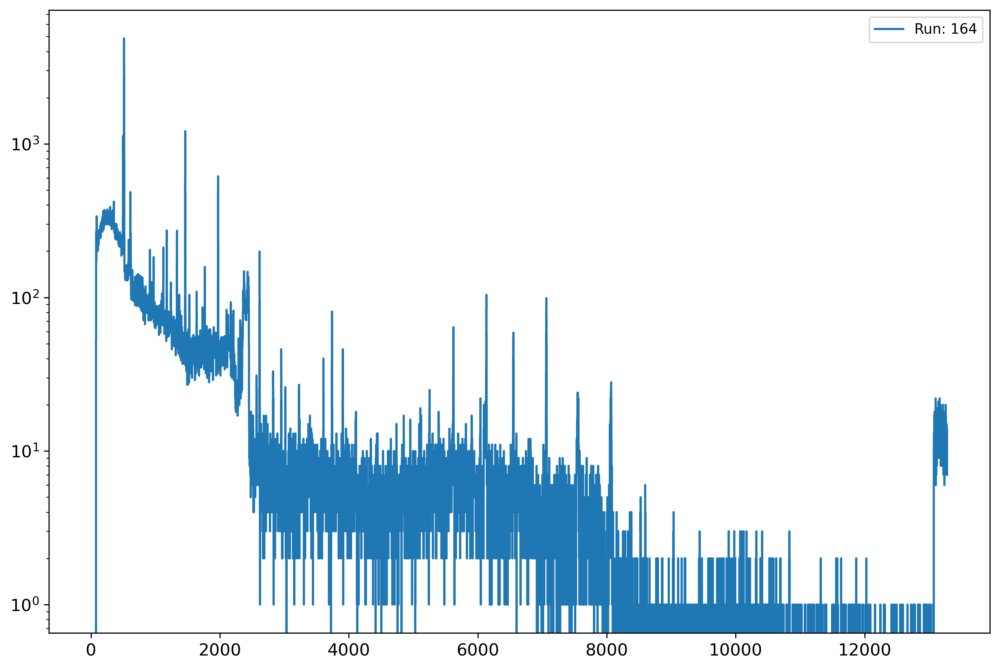

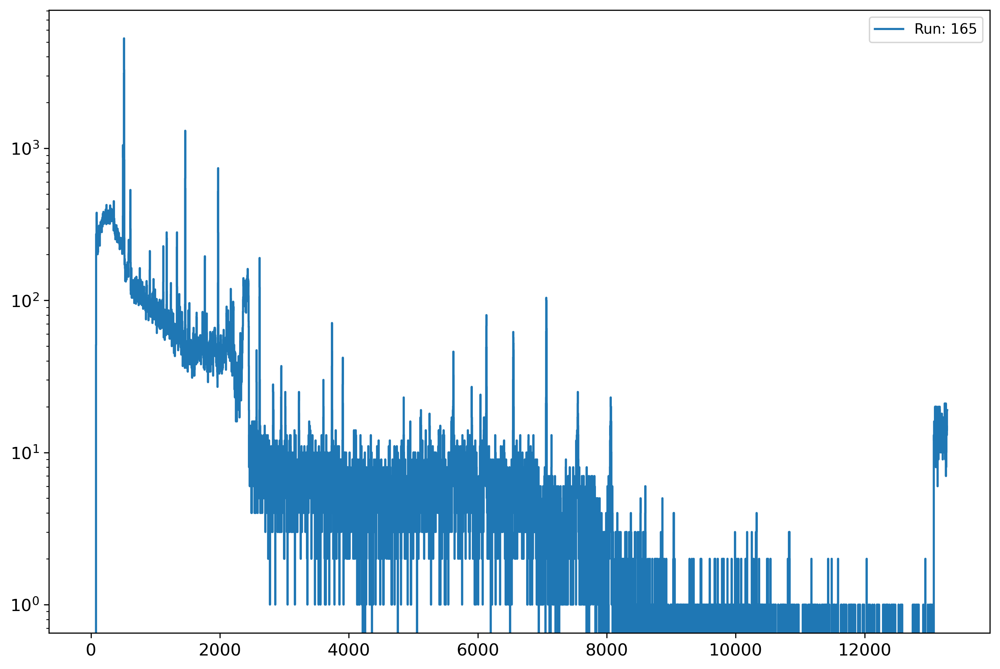

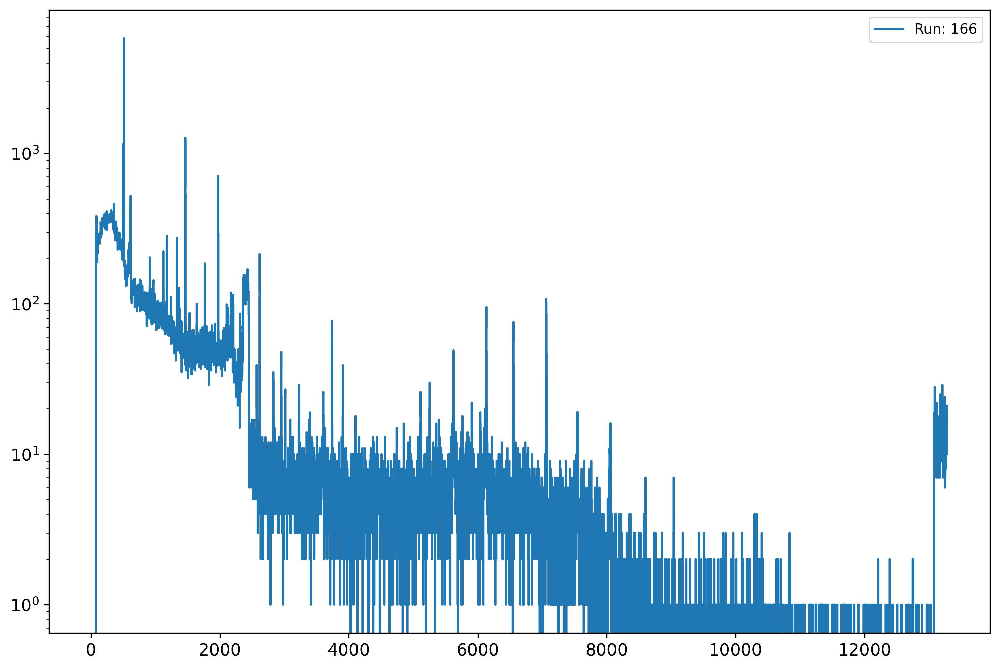

In [17]:
for i in range(len(runNumber)):
    file_path = "/data/pagroup/pa02/ND_39K_pg_data/Spectra/2021-07-39K-Run%s.mpa" %(runNumber[i])
    calibration_data = extract_calibration_info(file_path)
    caloff_1= calibration_data['ADC2']['caloff']
    calfact_1= 1.619880
    y_data_1 = calibration_data["DATA1,8192 "]
    y_data_err_1 = np.sqrt(y_data_1)
    x_1 = list(range(8192))
    x_cal_1 = (np.array(x_1))*calfact_1 +  caloff_1
    binwidth_1 = (8192*calfact_1 + caloff_1)/(8192)
    fig,ax=plt.subplots(1,1,figsize=(20,20))
    fig.set_dpi(300)
    fig.set_size_inches(12,8)
    plt.step(x_cal_1,y_data_1,label="Run: %d" %(runNumber[i]))
    #plt.step(x_cal_2,y_data_2,label="ADC_2")
    plt.yscale("log")
    plt.legend()

In [18]:
(611*39)/40 + 8328.178

8923.903

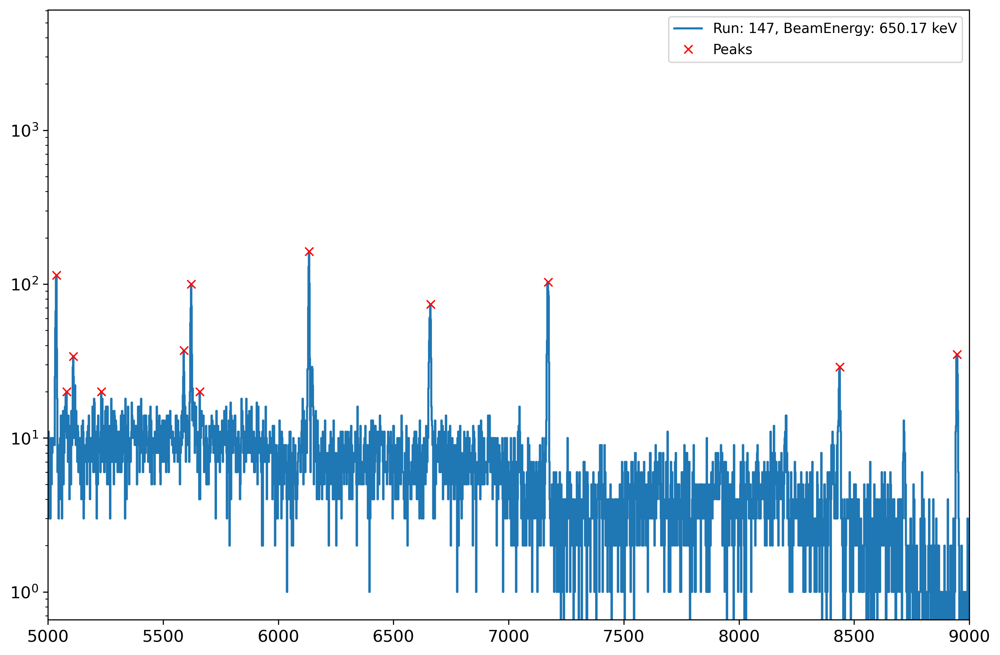

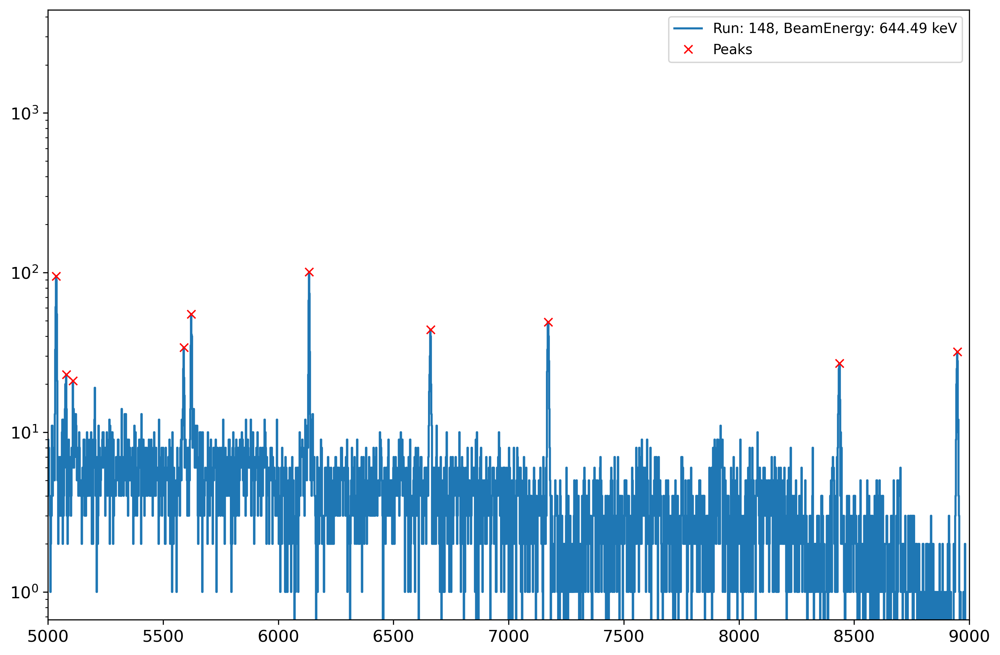

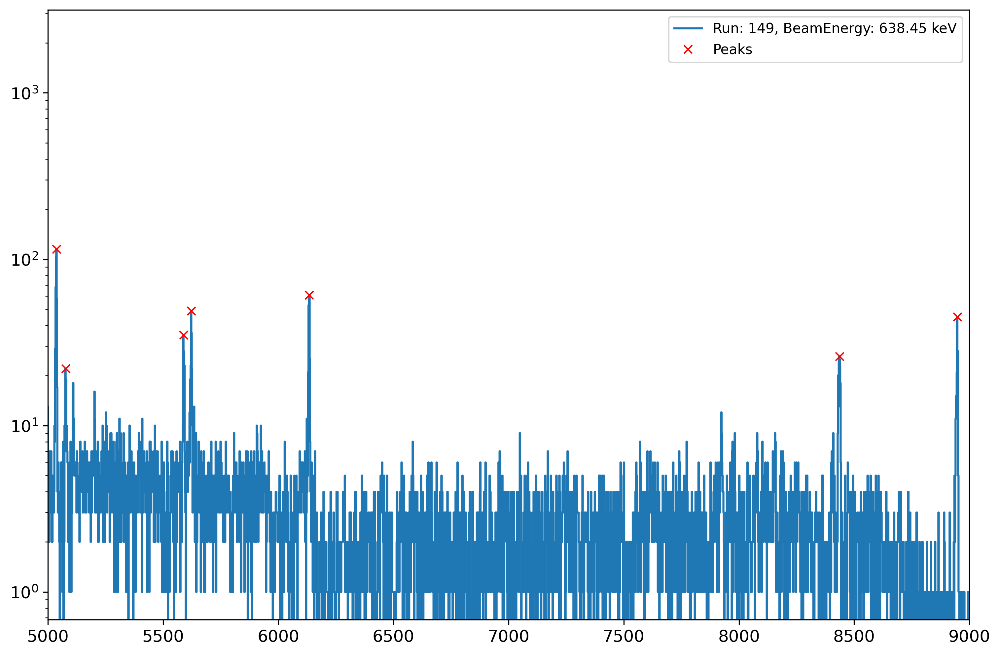

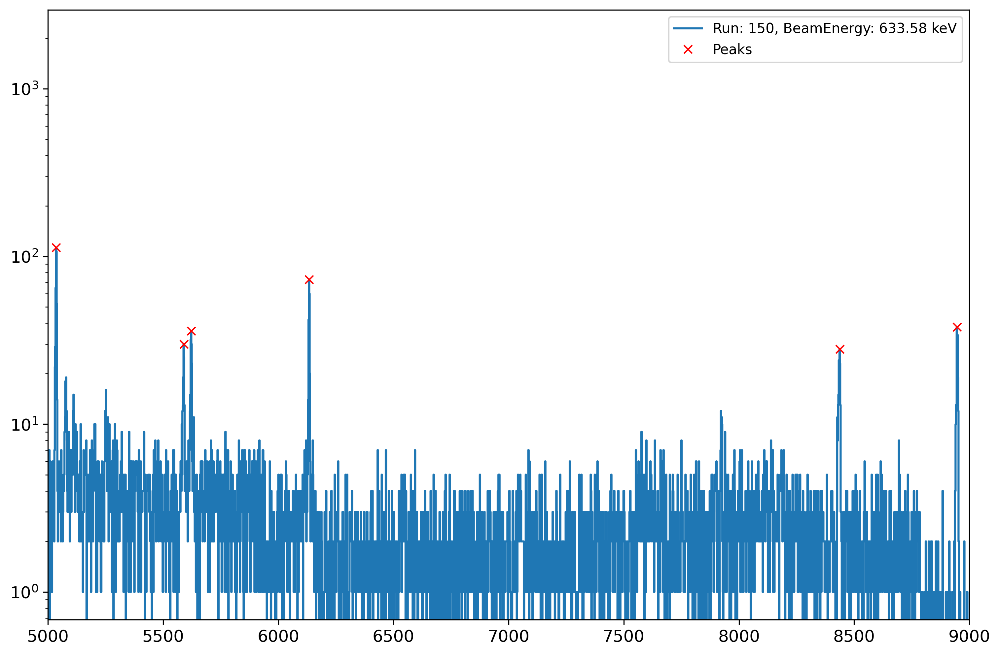

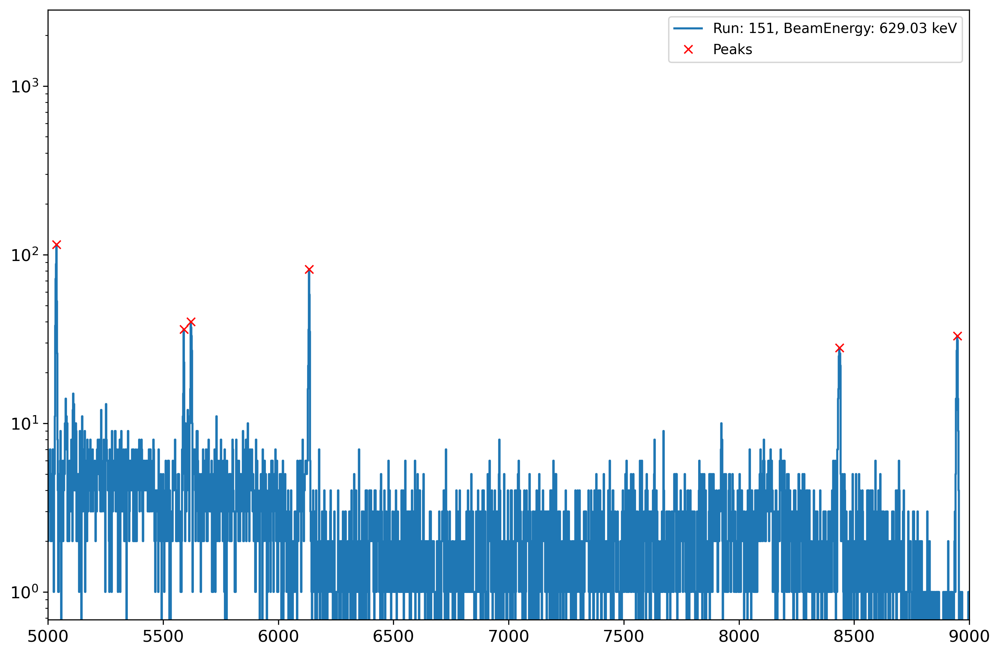

...

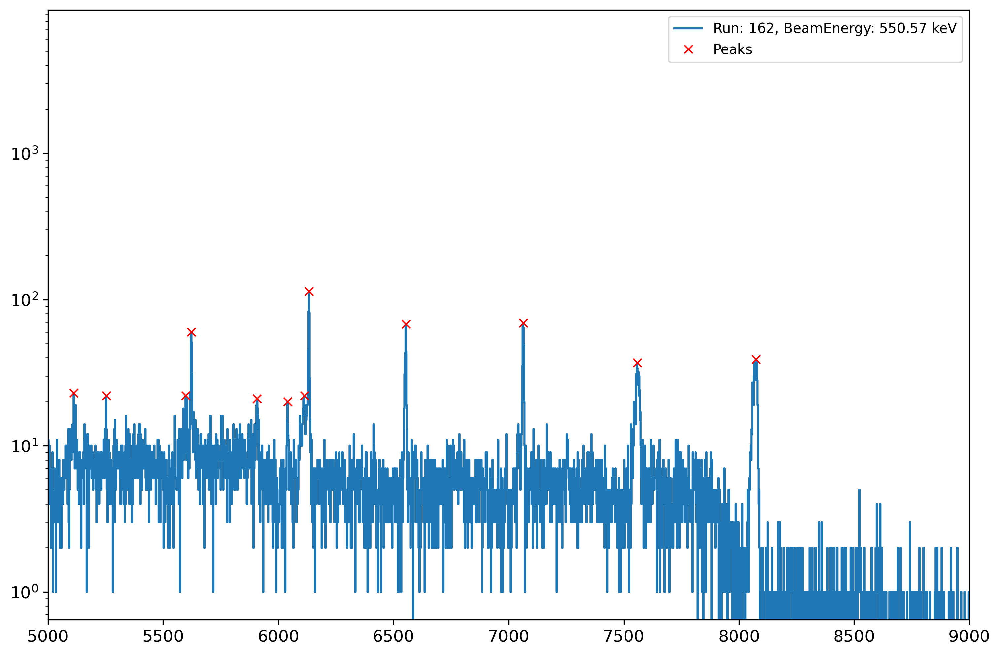

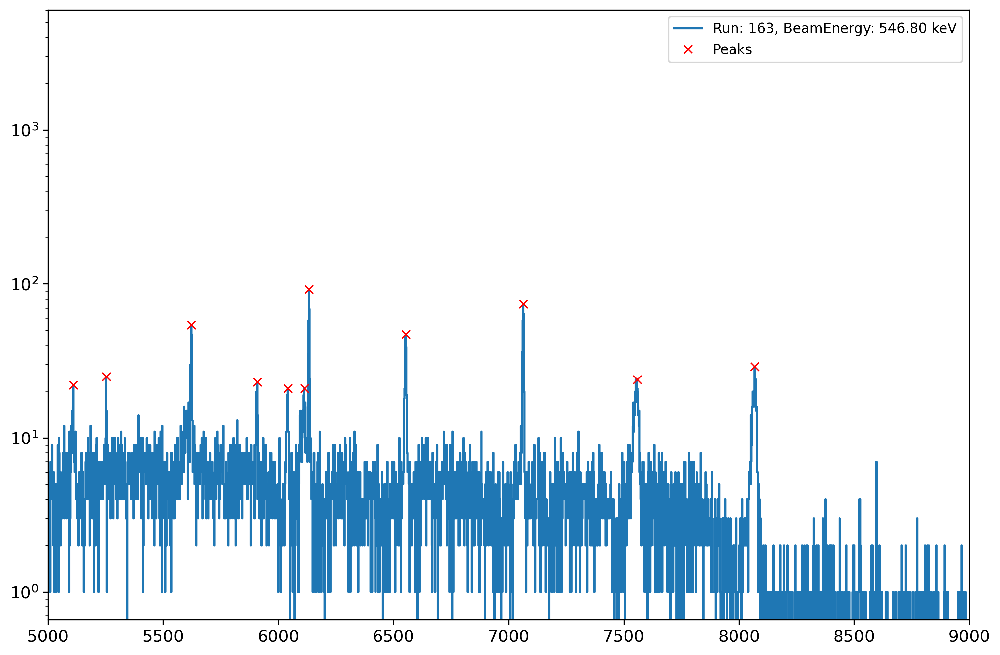

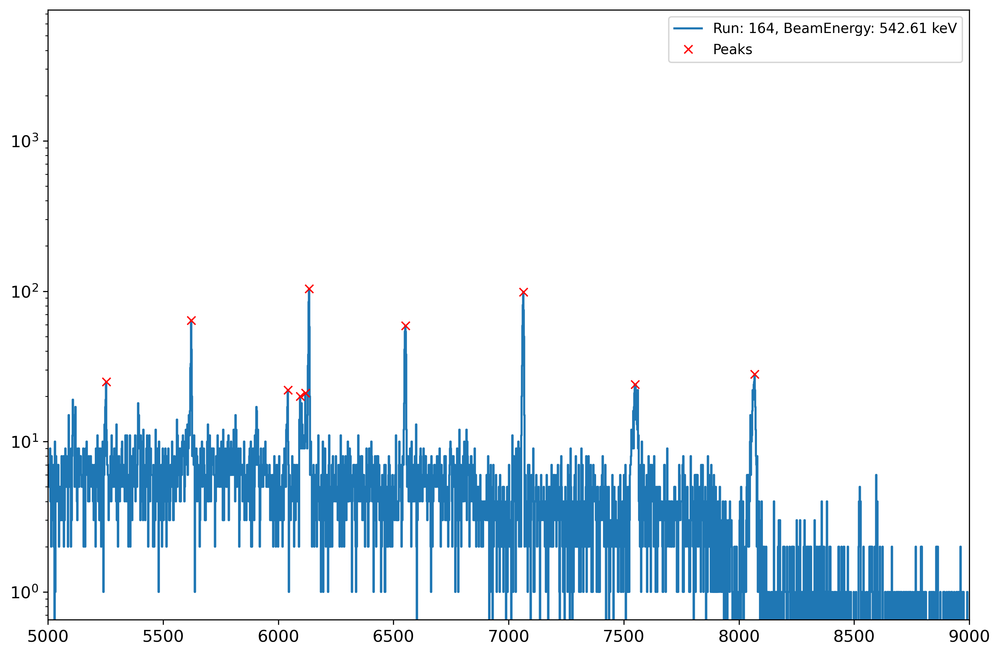

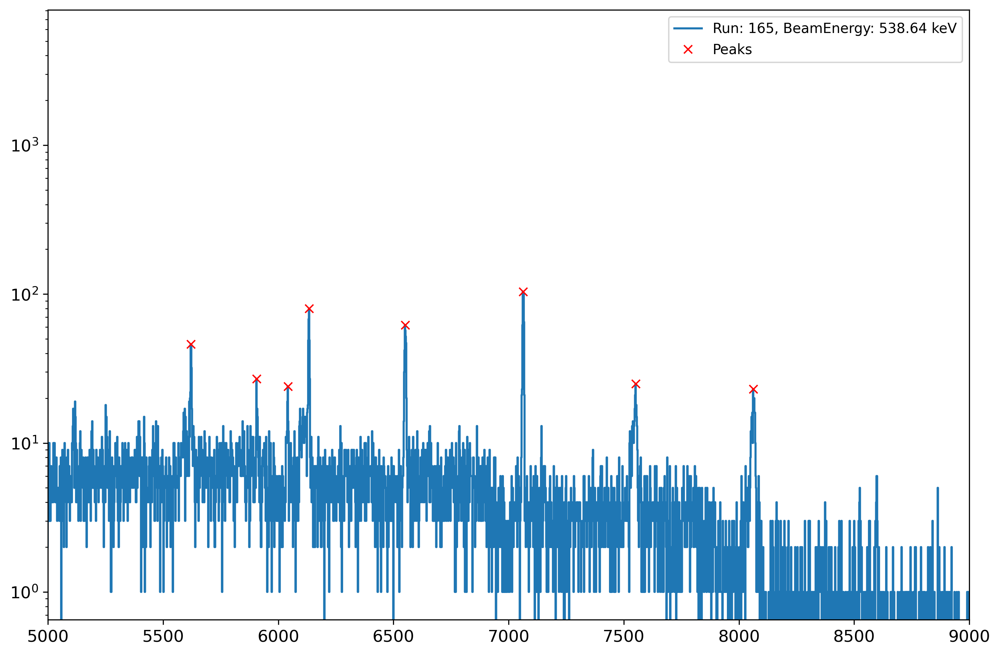

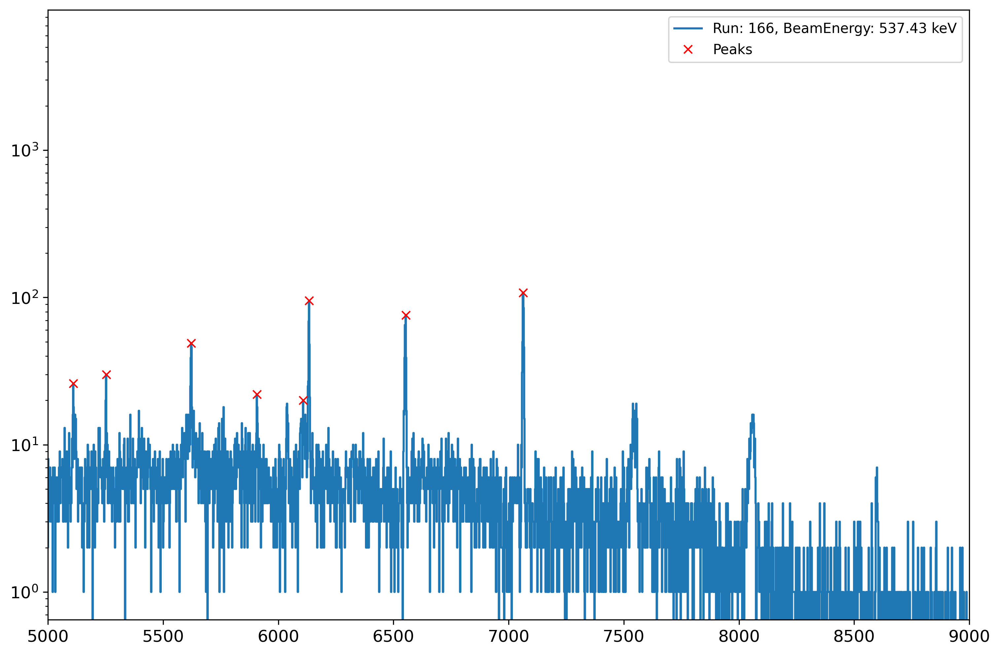

In [19]:
for i in range(len(runNumber)):
    file_path = "/data/pagroup/pa02/ND_39K_pg_data/Spectra/2021-07-39K-Run%s.mpa" %(runNumber[i])
    calibration_data = extract_calibration_info(file_path)
    caloff_1= calibration_data['ADC2']['caloff']
    calfact_1= 1.619880
    y_data_1 = calibration_data["DATA1,8192 "]
    y_data_err_1 = np.sqrt(y_data_1)
    x_1 = list(range(8192))
    x_cal_1 = (np.array(x_1))*calfact_1 +  caloff_1
    binwidth_1 = (8192*calfact_1 + caloff_1)/(8192)
    
    x_cal_1 = np.array(x_cal_1)
    y_data_1 = np.array(y_data_1)

    # Find peaks in the y_data_1
    peaks, _ = find_peaks(y_data_1, height=20, distance=10)
    peak_positions = x_cal_1[peaks]

    # Matplotlib figure details
    fig, ax = plt.subplots(1, 1, figsize=(20, 20))
    fig.set_dpi(300)
    fig.set_size_inches(12, 8)

    # Plot the step plot for the spectrum
    plt.step(x_cal_1, y_data_1, label="Run: %d, BeamEnergy: %0.2f keV" %(runNumber[i],beam_energy[i]))


    plt.plot(x_cal_1[peaks], y_data_1[peaks], "x", label='Peaks', color='red')


    plt.yscale("log")

    plt.xlim(5000,9000)
    plt.legend()
    plt.savefig("gamma_spectrum/run_%d_beamEnergy_%d.png" %(runNumber[i],beam_energy[i]))
    plt.show()

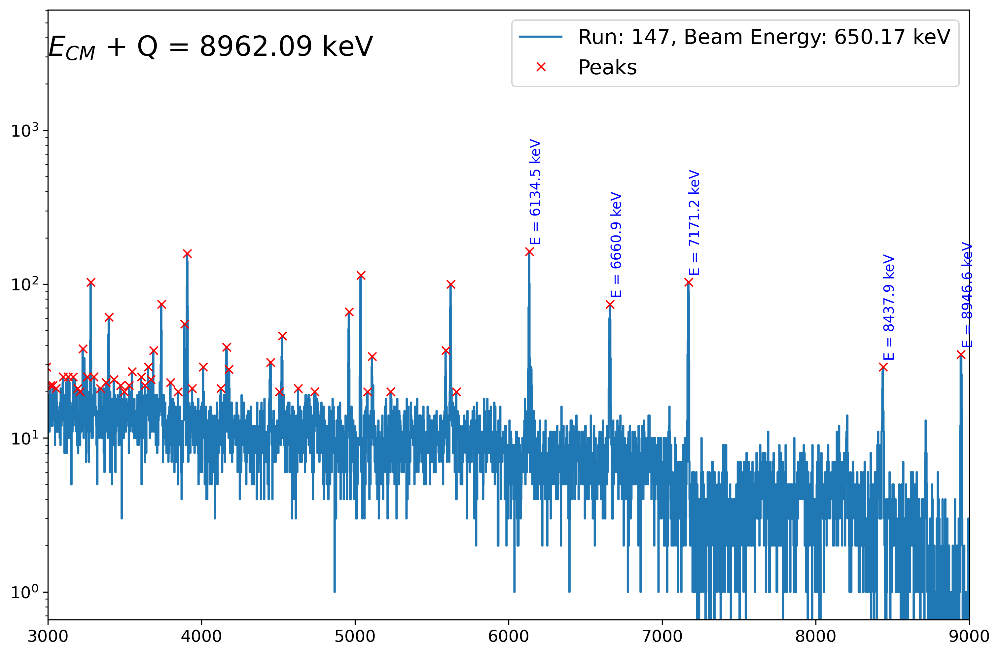

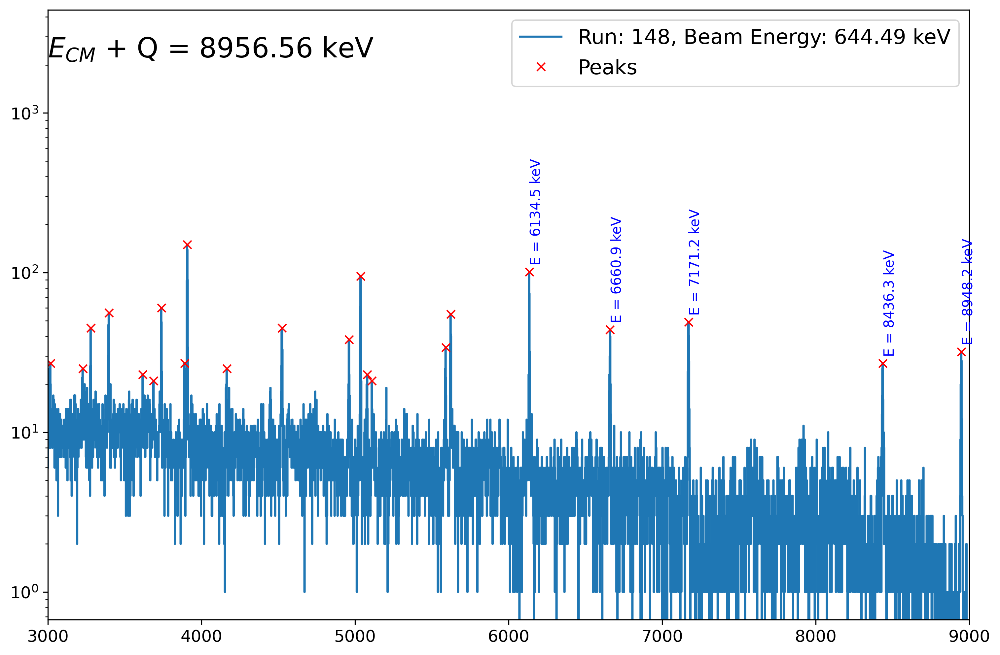

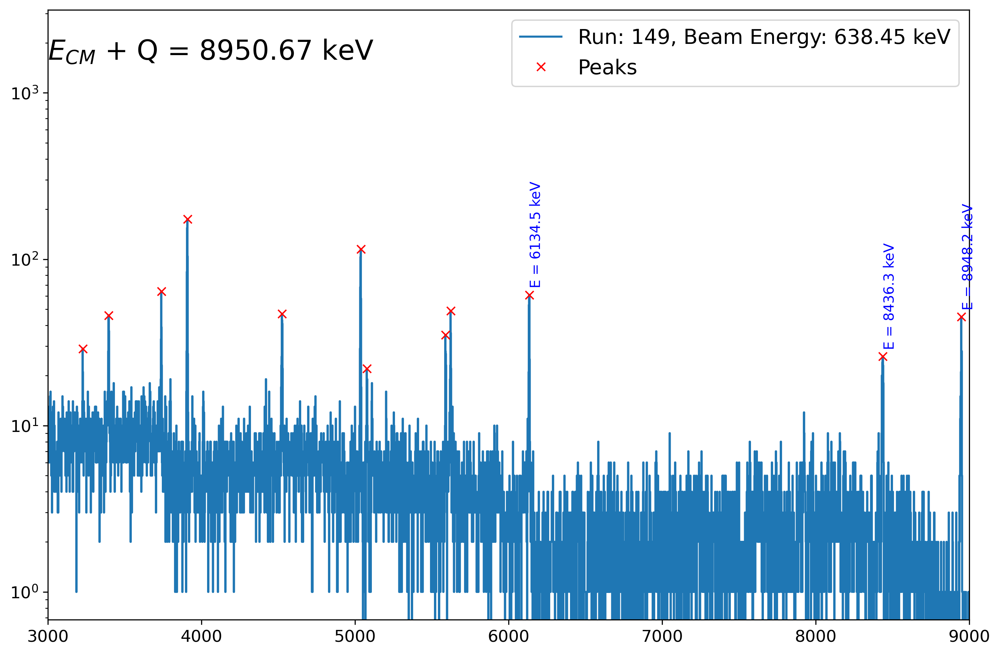

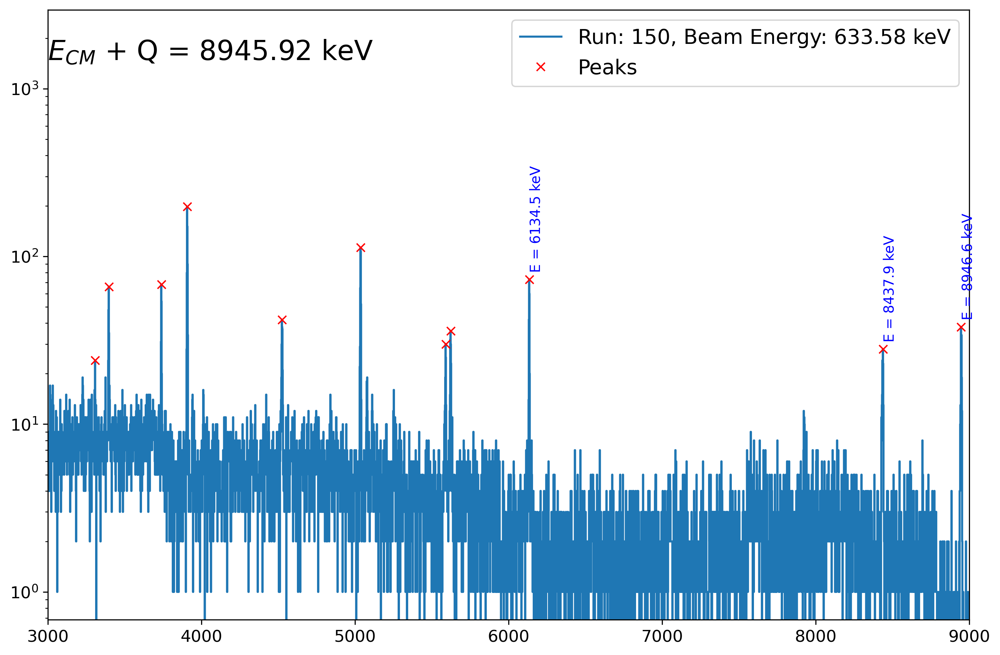

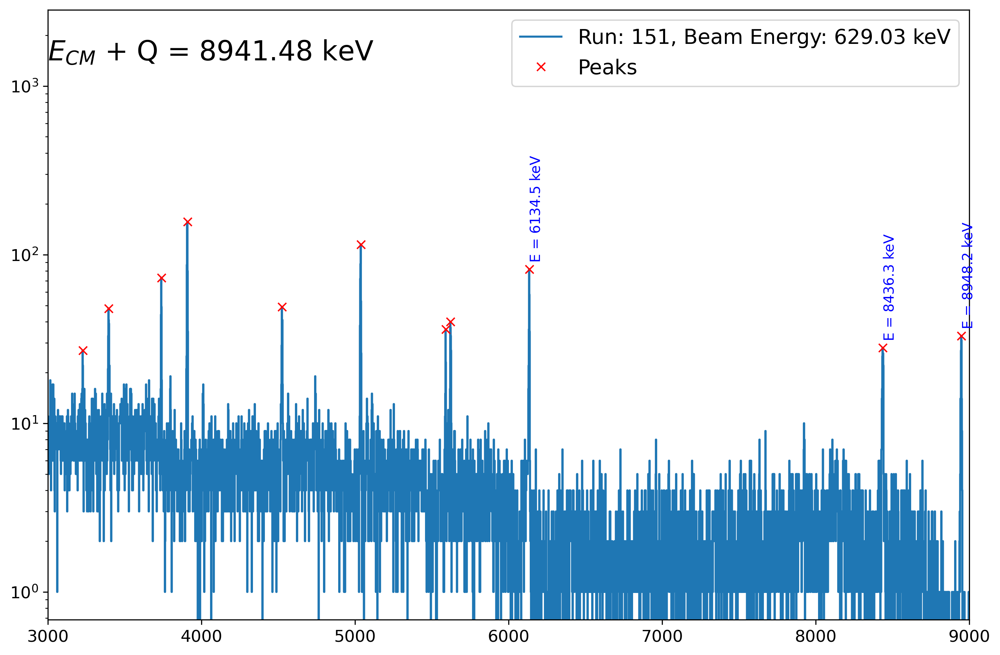

...

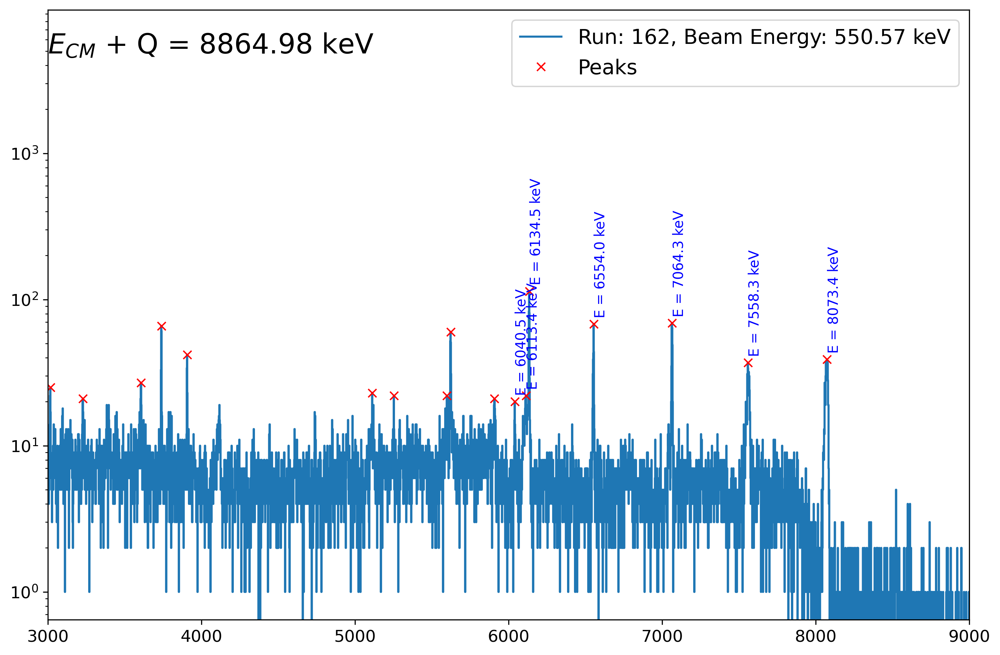

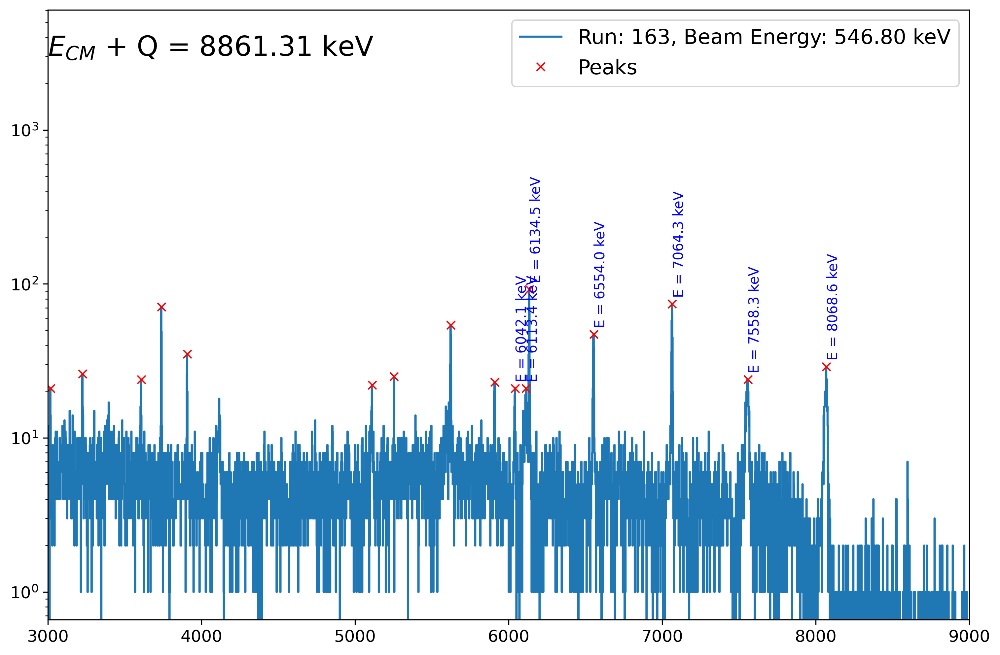

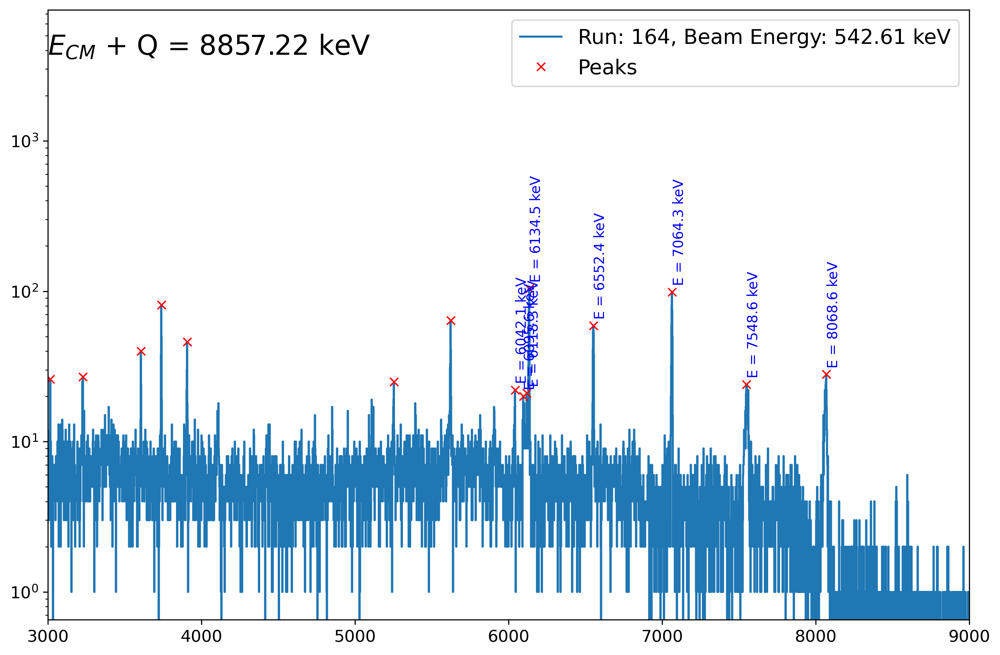

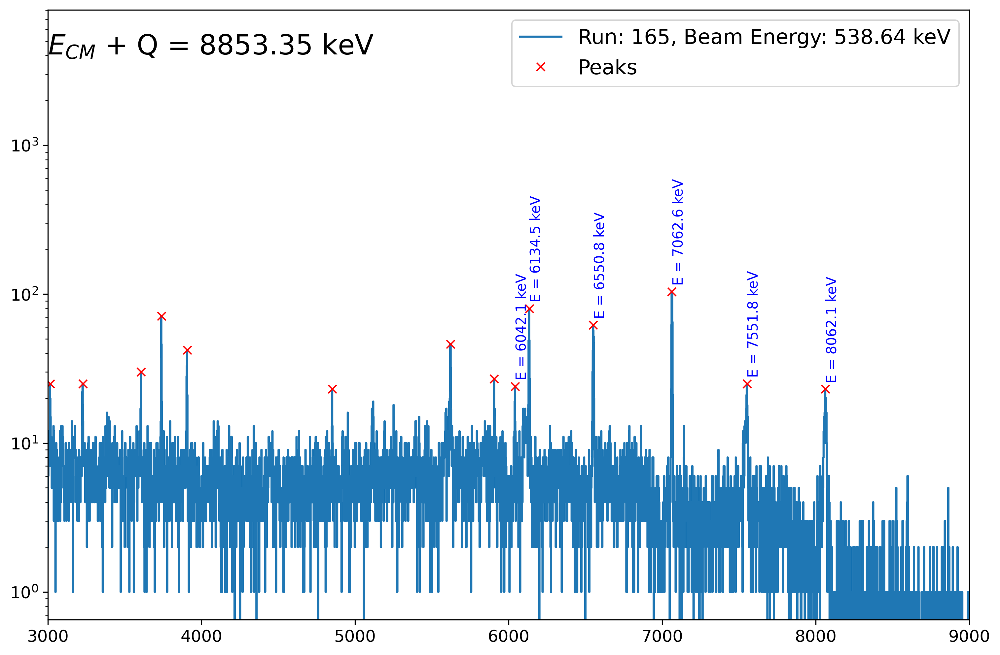

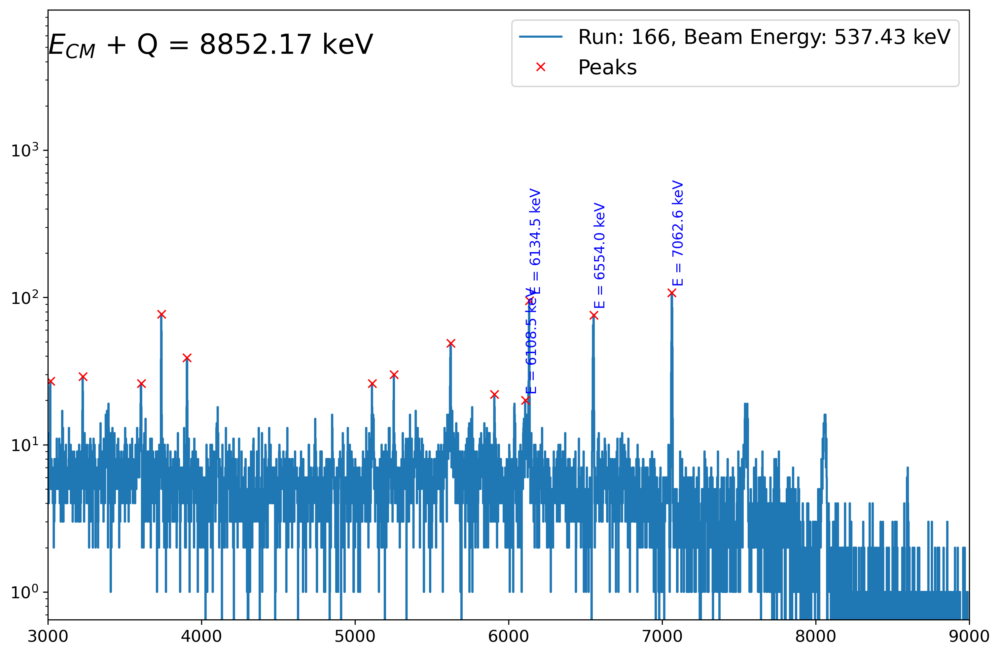

In [20]:
for i in range(len(runNumber)):
    file_path = "/data/pagroup/pa02/ND_39K_pg_data/Spectra/2021-07-39K-Run%s.mpa" %(runNumber[i])
    calibration_data = extract_calibration_info(file_path)
    caloff_1 = calibration_data['ADC2']['caloff']
    calfact_1 = 1.619880
    y_data_1 = calibration_data["DATA1,8192 "]
    y_data_err_1 = np.sqrt(y_data_1)
    x_1 = list(range(8192))
    x_cal_1 = (np.array(x_1)) * calfact_1 + caloff_1
    binwidth_1 = (8192 * calfact_1 + caloff_1) / 8192
    
    x_cal_1 = np.array(x_cal_1)
    y_data_1 = np.array(y_data_1)

    # Find peaks in the y_data_1
    peaks, _ = find_peaks(y_data_1, height=20, distance=10)
    peak_positions = x_cal_1[peaks]

    # Matplotlib figure details
    fig, ax = plt.subplots(1, 1, figsize=(20, 20))
    fig.set_dpi(300)
    fig.set_size_inches(12, 8)

    # Plot the step plot for the spectrum
    plt.step(x_cal_1, y_data_1, label="Run: %d, Beam Energy: %0.2f keV" % (runNumber[i], beam_energy[i]))

    # Plot peaks as red 'x'
    plt.plot(x_cal_1[peaks], y_data_1[peaks], "x", label='Peaks', color='red')

    E_ex = (beam_energy[i]*39)/40 + 8328.178

    # Add peak position text only within the range (6000, 9000)
    for j, peak in enumerate(peaks):
        if 6000 <= peak_positions[j] <= 9000:
            plt.text(x_cal_1[peak], y_data_1[peak] * 1.1, f"E = {peak_positions[j]:.1f} keV", 
                     rotation=90, verticalalignment='bottom', fontsize=10, color='blue')

    # Set logarithmic y-scale, x-axis limits, legend, and labels
    plt.yscale("log")
    plt.xlim(3000, 9000)
    
    # Get current y-axis limits
    y_min, y_max = plt.ylim()
    x_min,x_max = plt.xlim()

    # Set the y-coordinate for the text to be, for example, 90% of the y_max
    y_position = y_max * 0.5
    x_position = x_min*0.7

    # Plot the text at a fixed x-position (e.g., 6500) and the dynamic y_position
    plt.text(x_min, y_position, "$E_{CM}$ + Q = %0.2f keV" % (E_ex), fontsize=20)
   
    plt.legend(fontsize=15)
    
    # Save and display the plot
    plt.savefig("gamma_spectrum/run_%d_beamEnergy_%d.png" % (runNumber[i], beam_energy[i]))
    plt.show()


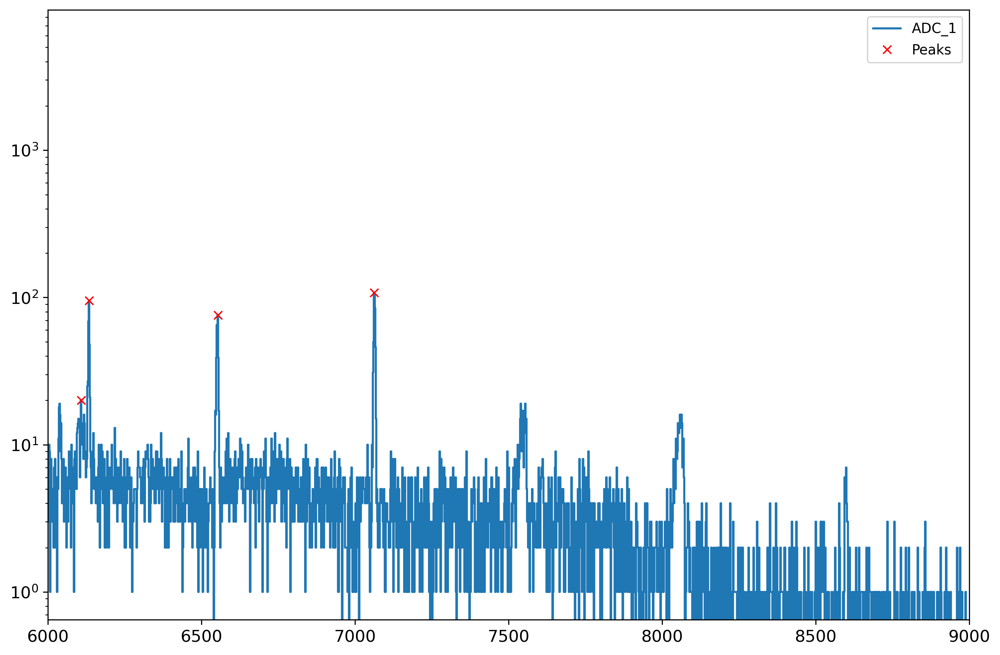

In [21]:
# Convert x_cal_1 and y_data_1 to numpy arrays (if they are not already)
x_cal_1 = np.array(x_cal_1)
y_data_1 = np.array(y_data_1)

# Find peaks in the y_data_1
peaks, _ = find_peaks(y_data_1, height=20, distance=10) 

# Matplotlib figure details
fig, ax = plt.subplots(1, 1, figsize=(20, 20))
fig.set_dpi(300)
fig.set_size_inches(12, 8)

# Plot the step plot for the spectrum
plt.step(x_cal_1, y_data_1, label="ADC_1")


plt.plot(x_cal_1[peaks], y_data_1[peaks], "x", label='Peaks', color='red')


plt.yscale("log")

plt.xlim(6000,9000)
plt.legend()
plt.show()

Peak Positions (x-values): [   87.44096   103.63976   119.83856   152.23616   173.2946    197.5928
   221.891     244.56932   267.24764   289.92596   315.84404   333.66272
   354.72116   372.53984   391.9784    413.03684   430.85552   447.05432
   472.9724    497.2706    513.4694    536.14772   555.58628   586.364
   612.28208   634.9604    662.49836   681.93692   711.09476   727.29356
   756.4514    780.7496    796.9484    830.96588   863.36348   887.66168
   913.57976   936.25808   955.69664   971.89544   996.19364  1017.25208
  1038.31052  1065.84848  1093.38644  1122.54428  1138.74308  1159.80152
  1176.00032  1206.77804  1239.17564  1260.23408  1278.05276  1300.73108
  1318.54976  1334.74856  1352.56724  1370.38592  1386.58472  1402.78352
  1433.56124  1462.71908  1498.35644  1527.51428  1546.95284  1564.77152
  1590.6896   1616.60768  1639.286    1663.5842   1700.84144  1731.61916
  1749.43784  1765.63664  1796.41436  1822.33244  1845.01076  1877.40836
  1896.84692  1922.765    1

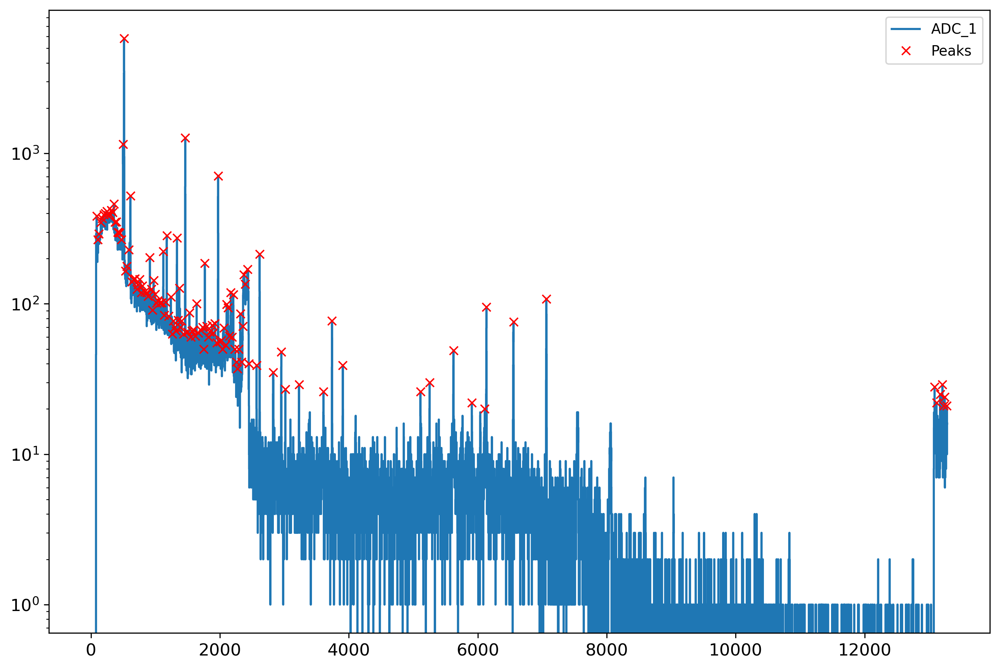

In [22]:
 
x_cal_1 = np.array(x_cal_1)
y_data_1 = np.array(y_data_1)

# Find peaks in the y_data_1
peaks, properties = find_peaks(y_data_1, height=20, distance=10)  

# Get the peak positions (corresponding x values)
peak_positions = x_cal_1[peaks]

# Get the peak heights (corresponding y values)
peak_heights = y_data_1[peaks]

# Output the peak positions and heights
print("Peak Positions (x-values):", peak_positions)
print("Peak Heights (y-values):", peak_heights)

# Plotting the data with identified peaks
fig, ax = plt.subplots(1, 1, figsize=(20, 20))
fig.set_dpi(300)
fig.set_size_inches(12, 8)

# Plot the spectrum
plt.step(x_cal_1, y_data_1, label="ADC_1")

# Highlight the peaks
plt.plot(peak_positions, peak_heights, "x", label='Peaks', color='red')

# Set log scale for y-axis
plt.yscale("log")

plt.legend()
plt.show()



In [23]:
"""

Expected_gamma_energies_40Ca = np.array([553, 754.8, 781, 787, 914, 1122, 1168.8, 1260, 1295, 1343, 1369, 1374.30, 1429, 1432, 1538, 1617, 1629,
                                        1651.9, 1698, 1773, 1827, 1862, 1877, 1880, 2004, 2028, 2037, 2112, 2120, 2178, 2297, 2300, 2374, 2381,
                                        2383, 2398, 2482, 2546, 2639, 2696, 2773, 2902, 2909, 2923, 2933, 3031, 3044, 3088, 3156, 3229, 3230, 3287,
                                        3414, 3454, 3466, 3563, 3585, 3736.1, 3822, 3903.9, 4043, 4050, 4209, 4491, 4542, 5249, 5630])

"""

'\n\nExpected_gamma_energies_40Ca = np.array([553, 754.8, 781, 787, 914, 1122, 1168.8, 1260, 1295, 1343, 1369, 1374.30, 1429, 1432, 1538, 1617, 1629,\n                                        1651.9, 1698, 1773, 1827, 1862, 1877, 1880, 2004, 2028, 2037, 2112, 2120, 2178, 2297, 2300, 2374, 2381,\n                                        2383, 2398, 2482, 2546, 2639, 2696, 2773, 2902, 2909, 2923, 2933, 3031, 3044, 3088, 3156, 3229, 3230, 3287,\n                                        3414, 3454, 3466, 3563, 3585, 3736.1, 3822, 3903.9, 4043, 4050, 4209, 4491, 4542, 5249, 5630])\n\n'

In [24]:

E_gamma = np.array([0.0, 3352.6, 3736.5, 551.8, 3903.9, 754.8, 1307.7, 1344.4, 787.4, 
                    1122.7, 1877.0, 2277.0, 5902.0, 2121.0, 750.9, 780.7, 2124.4, 2293.0, 
                    671.6, 1793.4, 2380.0, 2548.4, 6420.6, 1229.0, 1259.0, 2603.2, 
                    913.3, 1264.0, 1294.0, 2638.1, 969.0, 2091.0, 2678.1, 2845.1, 
                    3541.0, 1671.3, 2050.3, 1369.0, 2119.2, 3684.9, 1816.8, 2167.4, 
                    2198.0, 2217.5, 3561.8, 4113.5, 1247.1, 1506.8, 1629.6, 1917.6, 
                    3627.7, 3795.4, 1531.4, 2312.1, 3824.3, 1993.6, 2009.5, 2374.2, 
                    3886.2, 1373.1, 2045.6, 3167.9, 3920.0, 2399.2, 2080.6, 3957.5, 
                    3797.2, 2155.8, 4032.5, 2565, 3908, 7871.1, 2314.8, 3436.8, 
                    4191.5])




In [25]:
peak_positions = np.round(peak_positions,2)

In [26]:
peak_positions_filtered = peak_positions[peak_positions > 500]

In [27]:
len(peak_positions_filtered)

108

In [28]:
# Define a function to check if any element in first_array is within ±2 units of any element in expected_gamma_energies_40Ca
def find_matching_elements(first_array, expected_array, tolerance=10):
    matching_elements = []
    for expected in expected_array:
        lower_bound = expected - tolerance
        upper_bound = expected + tolerance
        # Check if any element in first_array is within the tolerance range
        matches = first_array[(first_array >= lower_bound) & (first_array <= upper_bound)]
        matching_elements.extend(matches)
    return np.unique(matching_elements)

# Find and print the matching elements
matching_elements = find_matching_elements(peak_positions_filtered,Expected_gamma_energy_from_levels)
print("Matching elements within ±2 units:", matching_elements)

NameError: name 'Expected_gamma_energy_from_levels' is not defined

In [ ]:
len(matching_elements)

In [ ]:
(622*39)/40 